Imagine that we are a data scientist working in a sports betting company.

The business executives in our company identified betting on soccer as a potential new business opportunity.

<div style=display: flex; justify-content: center;>
    <img width=400px height=auto src=https://images.unsplash.com/photo-1489944440615-453fc2b6a9a9?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1482&q=80 />
</div>

The problem is that our company doesn't know a lot about soccer (European football). Our manager asked we to analyse this dataset and see if we can provide anything that could give us a competitive advantage in the attempt to start strong in the new endevor.

We will split our analysis in various sections, therefore:

- [Data Extraction and Cleaning](#Data-Extraction-and-Cleaning)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Statistical Inference](#Statistical-Inference)
- [Data pre-processing](#Data-pre-processing)
- [Linear Model predictions](#Linear-Model-predictions)
- [Bonus Challenge](#Bonus-Challenge)
- [Conclusions](#conclusions)

# Data Extraction and Cleaning:

In [74]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from queries.sql_queries import *
from py_utilities.plotting import Plotter
from py_utilities.data_cleaner import calculate_stats_both_teams, DataCleaner
from py_utilities.model_fitting import ModelFitter
from statsmodels.tools.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor
import patsy
from sklearn import svm
import numpy as np
from scipy.stats import mannwhitneyu
from py_utilities.statistics_inference import (
    create_mean_std,
    calculate_effect_size,
    calculate_sample_size,
)
from sklearn.decomposition import PCA
import statsmodels.api as sm
from parallel_pandas import ParallelPandas

ParallelPandas.initialize(n_cpu=6, split_factor=4, disable_pr_bar=True)
import warnings

# Filter out the specific warning
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn.metrics._classification")



In [75]:
# Set styles for plots
qualitative_colors = [
    "tab:blue",
    "tab:orange",
    "tab:green",
    "tab:red",
    "tab:purple",
    "tab:brown",
    "tab:pink",
    "tab:gray",
    "tab:olive",
    "tab:cyan",
]

palette = "crest"
style = "darkgrid"

font = {"family": "serif", "size": 12}

# Set seaborn palette and style
sns.set(palette=palette, style=style, font=font)
plt.rc("font", **font)

# Exploratory Data Analysis

Let's start exploring our data and understand it more in depth.

In [76]:
con = sqlite3.connect("data/raw_data/database.sqlite")

# Check the available tables
tables = pd.read_sql(
    """
    SELECT * FROM sqlite_master 
    WHERE TYPE = 'table' """,
    con,
)

tables

,type,name,tbl_name,rootpage,sql
0,table,sqlite_sequence,sqlite_sequence,4,"CREATE TABLE sqlite_sequence(name,seq)"
1,table,Player_Attributes,Player_Attributes,11,"CREATE TABLE ""Player_Attributes"" (\n\t`id`\tIN..."
2,table,Player,Player,14,CREATE TABLE `Player` (\n\t`id`\tINTEGER PRIMA...
3,table,Match,Match,18,CREATE TABLE `Match` (\n\t`id`\tINTEGER PRIMAR...
4,table,League,League,24,CREATE TABLE `League` (\n\t`id`\tINTEGER PRIMA...
5,table,Country,Country,26,CREATE TABLE `Country` (\n\t`id`\tINTEGER PRIM...
6,table,Team,Team,29,"CREATE TABLE ""Team"" (\n\t`id`\tINTEGER PRIMARY..."
7,table,Team_Attributes,Team_Attributes,2,CREATE TABLE `Team_Attributes` (\n\t`id`\tINTE...


![Database Schema](data/raw_data/database_schema.png)

Judging by the outputs from the metadata, we have a total of 7 tables:

- League
- Country
- Team
- Match
- Player
- Player_Attributes
- Team_Attributes

Let's now try to answer some basic questions.

### Which teams score the most/fewest goals?

This time, let's see this goals breakdown by teams instead. Let's get the top 10.

In [79]:
teams_goals = pd.read_sql_query(teams_goals_query, con)
teams_goals.head(10)

,country,team,home_goal,away_goal
0,Spain,Real Madrid CF,505,147
1,Spain,FC Barcelona,495,101
2,Scotland,Celtic,389,88
3,Germany,FC Bayern Munich,382,96
4,Netherlands,PSV,370,126
5,England,Manchester City,365,125
6,Netherlands,Ajax,360,78
7,Switzerland,FC Basel,344,126
8,England,Manchester United,338,120
9,England,Chelsea,333,129


In [80]:
plotter = Plotter()
cleaner = DataCleaner()

teams_goals = teams_goals.drop(["country", "team"], axis=1)
teams_goals = cleaner.remove_outliers(teams_goals, threshold=2.5)

plotter.plot_regression_correlation(
    teams_goals, x="home_goal", y="away_goal", title="Home vs. Away Goals"
)

As we could have imagined, being Spain the country/league with the most goals scored, the teams with the most goals scored are Spanish. Interestingly, although Scotland has one of the leagues with least goals, a Scottish team is top 3 in the list. 

Another interesting aspect is that Italy is 4th in the list of overall goals scored, but no Italian team appears here.

The regression analysis indicates a statistically significant positive relationship between the number of home goals scored and the number of away goals scored. The coefficient of 0.43 suggests that, on average, for each additional goal scored at home, there is an expected increase of 0.43 goals scored away. The intercept of 44.70 represents the estimated number of away goals when the number of home goals is zero. The overall model has an R-squared value of 0.59, indicating that approximately 59% of the variability in away goals can be explained by the number of home goals

- R^2 : 0.59
- away_goal = 0.43 * home_goal + 44.70 

### What are the best players according to their potential?

In [81]:
players_potential = pd.read_sql_query(players_potential_query, con)
players_potential.head(10)

,Player_Name,DOB,Age,Height,Weight,Rating,Potential,Preferred_Foot,Attacking_Work_Rate,Defensive_Work_Rate
0,Lionel Messi,24-06-1987,30,170.18,159,94,97,left,medium,low
1,Ronaldinho,21-03-1980,37,182.88,168,91,95,right,medium,low
2,Cristiano Ronaldo,05-02-1985,32,185.42,176,93,95,right,high,low
3,Zlatan Ibrahimovic,03-10-1981,36,195.58,209,90,94,right,medium,low
4,Robinho,25-01-1984,33,175.26,146,87,94,right,high,medium
5,Neymar,05-02-1992,25,175.26,150,90,94,right,high,medium
6,Wayne Rooney,24-10-1985,32,175.26,183,93,93,right,high,high
7,Thierry Henry,17-08-1977,40,187.96,183,91,93,right,medium,low
8,Theo Walcott,16-03-1989,28,175.26,150,82,93,left,high,medium
9,Sergio Aguero,02-06-1988,29,172.72,163,88,93,left,high,low


- The players with the highest potential as of 2016 (the last year of the dataset) are all around 30+ years old;
- An exception is Neymar who was 25 years old at the time;
- The average height is 181cm and average weight 168kg;
- The average Rating and Potential are 70 and 76, signaling the huge gap between top world players and the rest.

In [83]:
plotter.plotly_correlation_heatmap(players_potential)

From this correlation heatmap, it is clear that Rating and Potential are highly correlated, let's try to understand this with another linear regression.

# Matches dataset 

Let's get ready to capture the final dataset for our analysis, in which we will try to predict match outcomes based on various features. 

We will focus on trying to predict for matches in the English 'Premier League'.

In [85]:
matches_df = pd.read_sql_query(match_analysis, con)
matches_df

,league_id,country,league,season,date,match_api_id,home_team_api_id,away_team_api_id,home_goal,away_goal,...,B365A,BWH,BWD,BWA,IWH,IWD,IWA,LBH,LBD,outcome
0,1729,England,Premier League,2008/2009,2008-08-17 00:00:00,489042,10260,10261,1,1,...,11.00,1.30,4.75,8.25,1.30,4.40,8.50,1.25,4.50,1
1,1729,England,Premier League,2008/2009,2008-08-16 00:00:00,489043,9825,8659,1,0,...,15.00,1.22,5.50,10.00,1.20,5.20,11.00,1.20,5.00,2
2,1729,England,Premier League,2008/2009,2008-08-16 00:00:00,489044,8472,8650,0,1,...,1.67,5.00,3.35,1.67,4.50,3.50,1.65,4.50,3.30,0
3,1729,England,Premier League,2008/2009,2008-08-16 00:00:00,489045,8654,8528,2,1,...,4.20,1.90,3.20,3.80,1.80,3.30,3.80,1.80,3.20,2
4,1729,England,Premier League,2008/2009,2008-08-17 00:00:00,489046,10252,8456,4,2,...,4.33,1.95,3.20,3.60,2.00,3.20,3.30,1.83,3.20,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3035,1729,England,Premier League,2015/2016,2015-10-17 00:00:00,1988795,8466,8197,2,2,...,5.00,1.75,3.70,4.40,1.80,3.50,4.20,1.75,3.75,1
3036,1729,England,Premier League,2015/2016,2015-10-19 00:00:00,1988796,10003,10194,0,1,...,4.20,2.05,3.20,3.75,2.00,3.30,3.60,2.05,3.40,0
3037,1729,England,Premier League,2015/2016,2015-10-17 00:00:00,1988797,8586,8650,0,0,...,3.00,2.50,3.20,2.95,2.50,3.20,2.75,2.40,3.40,1
3038,1729,England,Premier League,2015/2016,2015-10-17 00:00:00,1988798,9817,9825,0,3,...,1.62,5.00,4.10,1.60,5.00,3.90,1.60,6.00,4.00,0


In [86]:
teams_stats = pd.read_sql_query(team_stats_query, con)
teams_stats

,Team,Country,league,id,team_fifa_api_id,team_api_id,defencePressure,defenceAggression,buildUpPlaySpeed,buildUpPlayPassing
0,Arsenal,England,Premier League,73,1,9825,57,57,25,32
1,Aston Villa,England,Premier League,82,2,10252,35,44,63,54
2,Birmingham City,England,Premier League,168,88,8658,30,60,45,60
3,Blackburn Rovers,England,Premier League,177,3,8655,50,50,44,62
4,Blackpool,England,Premier League,181,1926,8483,49,52,45,52
5,Bolton Wanderers,England,Premier League,199,4,8559,40,55,45,70
6,Bournemouth,England,Premier League,228,1943,8678,48,50,39,38
7,Burnley,England,Premier League,250,1796,8191,24,56,36,52
8,Cardiff City,England,Premier League,273,1961,8344,33,41,60,54
9,Chelsea,England,Premier League,310,5,8455,42,43,46,41


In [87]:
teams_stats.drop(
    ["Team", "Country", "league", "id", "team_fifa_api_id", "team_api_id", "id"], axis=1
)

matches_df = pd.merge(
    matches_df,
    teams_stats,
    left_on="home_team_api_id",
    right_on="team_api_id",
    how="left",
)

Well, those columns on 'shoton', 'foul','card' and so on are full of information about the match, but are presented in a format that looks like xml format, therefore we will have to unpack them before proceeding with the analysis.

In [88]:
stats_df = matches_df[
    [
        "goals",
        "shoton",
        "shotoff",
        "foulcommit",
        "card",
        "cross",
        "corner",
        "possession",
        "home_team_api_id",
        "away_team_api_id",
    ]
].copy()

stats_columns = {
    "on_target_shot": "shoton",
    "off_target_shot": "shotoff",
    "foul": "foulcommit",
    "yellow_card": "card",
    "red_card": "card",
    "crosses": "cross",
    "corner": "corner",
    "possession": "possession",
}

# Loop through and create the new columns
for new_col, source_col in stats_columns.items():
    home_col = f"{new_col}_home_team"
    away_col = f"{new_col}_away_team"

    card_type = "r" if "red_card" in new_col else "y"

    stats_df[[home_col, away_col]] = stats_df[
        [source_col, "home_team_api_id", "away_team_api_id"]
    ].apply(
        lambda x: calculate_stats_both_teams(
            x[source_col],
            x["home_team_api_id"],
            x["away_team_api_id"],
            card_type=card_type,
        ),
        axis=1,
        result_type="expand",
    )

# Drop the source columns
matches_df.drop(columns=list(stats_columns.values()), inplace=True)
matches_df.dropna(inplace=True)

Great, now that all the XML data is cleaned, we can proceed with the analysis. Let's check once more that there are no nulls after our transformations.

In [89]:
matches_df["date"] = matches_df["date"].str.split().str[0]
matches_df.to_csv('data/clean_data/matches.csv', index=False)
matches_df = matches_df.dropna()
matches_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2959 entries, 0 to 3039
Data columns (total 55 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   league_id           2959 non-null   int64  
 1   country             2959 non-null   object 
 2   league_x            2959 non-null   object 
 3   season              2959 non-null   object 
 4   date                2959 non-null   object 
 5   match_api_id        2959 non-null   int64  
 6   home_team_api_id    2959 non-null   int64  
 7   away_team_api_id    2959 non-null   int64  
 8   home_goal           2959 non-null   int64  
 9   away_goal           2959 non-null   int64  
 10  home_player_1       2959 non-null   int64  
 11  home_player_2       2959 non-null   float64
 12  home_player_3       2959 non-null   int64  
 13  home_player_4       2959 non-null   int64  
 14  home_player_5       2959 non-null   float64
 15  home_player_6       2959 non-null   int64  
 16  home_player

# Data pre-processing

We are here ready to start with the prediction of the match outcomes. What we will do is:

- first visualize the distribution of our dataset features;
- set the target variable;
- analyse the interactions between the variables;
- fit a linear predictive model. 

In [96]:
model_fitter = ModelFitter()

In [97]:
print("Outcome Counts:")
print(matches_df["outcome"].value_counts())

print("\nOutcome Percentages:")
print(matches_df["outcome"].value_counts(normalize=True) * 100)

plotter.plotly_histogram(matches_df, "outcome")

Outcome Counts:
outcome
2    1348
0     845
1     766
Name: count, dtype: int64

Outcome Percentages:
outcome
2    45.555931
0    28.556945
1    25.887124
Name: proportion, dtype: float64


Immediately from here, we can see how many matches have been won, lost or drawn by the home team. There's definitely a majority of matches won by the home team.

Now, if we were to proceed like this, our model will most likely be 100% correct every time, why? Because in our dataset, besides the outcome/target variable, we also include the *home_goals* and *away_goals* variables. This means, the model can lazily pick only these two columns, and make the assumption that if there's more of one than the other, the team has won.

Therefore, to avoid this issue and based on the fact that we can see already that there is a majority of matches won by the home team, we will remove the *home_goals* and *away_goals* columns.


Because our data is divided into many seasons, we can keep data from a certain point onwards to test our model on. The data before 2015 will be used to train our model, and the data after 2015 will be used to test our model.

In [98]:
cutoff_date = pd.to_datetime('2015-01-01')
matches_df['date'] = pd.to_datetime(matches_df['date'])

train_df = matches_df[matches_df['date'] < cutoff_date]
test_df = matches_df[matches_df['date'] >= cutoff_date]

In [99]:
X_train = train_df.drop(['outcome','date','home_goal','away_goal','match_api_id','team_api_id','id','league_id','team_fifa_api_id'], axis=1)
X_train = X_train.select_dtypes(exclude=["object"])
y_train = train_df['outcome']

X_test = test_df.drop(['outcome','date','home_goal','away_goal','match_api_id','team_api_id','id','league_id','team_fifa_api_id'], axis=1)
X_test = X_test.select_dtypes(exclude=["object"])
y_test = test_df['outcome']

In [100]:
x = add_constant(X_train.copy())
vic = pd.DataFrame()
vic["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
vic["features"] = x.columns
vic

,VIF,features
0,640.759967,const
1,1.186169,home_team_api_id
2,1.070542,away_team_api_id
3,1.317771,home_player_1
4,1.370766,home_player_2
5,1.137168,home_player_3
6,1.162762,home_player_4
7,1.377270,home_player_5
8,1.159731,home_player_6
9,1.148496,home_player_7


All the values are way below 10, which means we likely don't have to worry about multicollinearity, except for those betting columns which are highly intercorrelated.

In [101]:
X_train = X_train.drop(['B365H',
'B365D',
'B365A',
'BWH',
'BWD',
'BWA',
'IWH',
'IWD',
'IWA',
'LBH',
'LBD'], axis=1)

X_test = X_test.drop(['B365H',
'B365D',
'B365A',
'BWH',
'BWD',
'BWA',
'IWH',
'IWD',
'IWA',
'LBH',
'LBD'], axis=1)

# Linear Model for Matches prediction

Finally, we are ready to fit the model to the data.

In [103]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2397 entries, 0 to 2659
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   home_team_api_id    2397 non-null   int64  
 1   away_team_api_id    2397 non-null   int64  
 2   home_player_1       2397 non-null   int64  
 3   home_player_2       2397 non-null   float64
 4   home_player_3       2397 non-null   int64  
 5   home_player_4       2397 non-null   int64  
 6   home_player_5       2397 non-null   float64
 7   home_player_6       2397 non-null   int64  
 8   home_player_7       2397 non-null   float64
 9   home_player_8       2397 non-null   float64
 10  home_player_9       2397 non-null   float64
 11  home_player_10      2397 non-null   float64
 12  home_player_11      2397 non-null   float64
 13  away_player_1       2397 non-null   int64  
 14  away_player_2       2397 non-null   float64
 15  away_player_3       2397 non-null   float64
 16  away_player

In [29]:
model_fitter = ModelFitter()

model = sm.MNLogit(y_train, X_train)
results = model.fit()
print(results.summary())

Optimization terminated successfully.
         Current function value: 1.030775
         Iterations 5
                          MNLogit Regression Results                          
Dep. Variable:                outcome   No. Observations:                 2397
Model:                        MNLogit   Df Residuals:                     2341
Method:                           MLE   Df Model:                           54
Date:                Wed, 22 Nov 2023   Pseudo R-squ.:                 0.03072
Time:                        20:42:27   Log-Likelihood:                -2470.8
converged:                       True   LL-Null:                       -2549.1
Covariance Type:            nonrobust   LLR p-value:                 6.219e-12
         outcome=1       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
home_team_api_id   -1.904e-05   6.77e-05     -0.281      0.779      -0.000       0.000
away_

## Multinomial Logit Statistics:

- **Pseudo R-squared:** The Pseudo R-squared value (0.03072) indicates how well the model explains the variance in the data. In multinomial logistic regression, there's no direct equivalent to R-squared in linear regression, but this value can be used to assess model fit.

- **Coefficients:** Coefficients represent the log-odds of the outcome variable being in a specific category (e.g., outcome=1 or outcome=2) for each predictor variable. These coefficients are used to make predictions.

- **P-values:** P-values are associated with each coefficient and indicate the significance of each predictor variable. In general, lower p-values (typically below 0.05) suggest that a variable is statistically significant in predicting the outcome. The only seemingly significant variables in predicting outcome=2 are 'defencePressure' and 'buildUpPlayPassing'.

- **Intercept:** The intercepts represent the log-odds of the reference category (usually the first category) of the outcome variable when all predictor variables are zero. In this model, there is an intercept for each outcome category.

- **Converged:** The "converged" status indicates whether the optimization process successfully converged to a solution. In this case, it did.

- **LLR P-value:** The LLR (Likelihood Ratio Test) p-value (6.219e-12) is used to assess whether the model, with all predictors, is significantly better than a null model (with no predictors). A very low p-value suggests that the model is statistically significant.

Overall, our model has identified significant predictor variables, and the coefficients provide information about the direction and strength of their relationship with the outcome categories. We should pay attention to the coefficients' signs and magnitudes to interpret the impact of each variable on the probability of different outcome categories. Additionally, we may want to consider model evaluation, such as classification accuracy, to assess how well the model performs in practice.

In [30]:
grid_search = model_fitter.classification_model(X_train, y_train, smote=True)
model = grid_search.best_estimator_

test_results, y_pred = model_fitter.evaluate_classification_model(
    model, X_test, y_test, data_type="test"
)
test_scores_df = pd.DataFrame(test_results)

train_results, y_train_pred = model_fitter.evaluate_classification_model(
    model, X_train, y_train, data_type="train"
)
train_scores_df = pd.DataFrame(train_results)

/home/alessio-pc/PycharmProjects/Soccer_matches_prediction/.venv/lib64/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/alessio-pc/PycharmProjects/Soccer_matches_prediction/.venv/lib64/python3.11/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/home/alessio-pc/PycharmProjects/Soccer_matches_prediction/.venv/lib64/python3.11/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/alessio-pc/PycharmProjects/Soccer_matches_prediction/.venv/lib64/python3.11/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^

{'classifier__C': 0.01, 'classifier__fit_intercept': True, 'classifier__max_iter': 10, 'classifier__solver': 'newton-cg', 'classifier__tol': 0.001}


/home/alessio-pc/PycharmProjects/Soccer_matches_prediction/.venv/lib64/python3.11/site-packages/sklearn/model_selection/_validation.py:821: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/alessio-pc/PycharmProjects/Soccer_matches_prediction/.venv/lib64/python3.11/site-packages/sklearn/model_selection/_validation.py", line 810, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/alessio-pc/PycharmProjects/Soccer_matches_prediction/.venv/lib64/python3.11/site-packages/sklearn/metrics/_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/alessio-pc/PycharmProjects/Soccer_matches_prediction/.venv/lib64/python3.11/site-packages/sklearn/metrics/_s

In [31]:
print(f"The total accuracy for the model is: {model.score(X_test, y_test).round(3) * 100}%")

The total accuracy for the model is: 33.6%


In [32]:
y_probs = grid_search.predict_proba(X_test)[:, 1]

plotter.plot_multiclass_roc_auc_curve(y_probs, y_test)

The ROC-AUC (Receiver Operating Characteristic - Area Under the Curve) values for each class represent the performance of our multiclass classification model for different classes. Here's what we can interpret from these values:

- **Class 0** (Home Team Lost): **AUC = 0.54**
An AUC of 0.54 suggests that the model's ability to distinguish between this class (Home Team Lost) and other classes is better than random guessing. However, it's not very high, indicating that there is room for improvement in classifying this category.

- **Class 1** (Draw): **AUC = 0.48**
AUC of 0.48 is slightly worst than Class 0, and than random choice. It suggests that the model has some predictive power for this category close to random, but less than Class 0.

- **Class 2** (Home Team Won): **AUC = 0.49**
An AUC of 0.49 for Class 2 suggests that the model's performance in distinguishing this class is very close to random.

Overall, these AUC values suggest that the model's performance varies for different classes. It's relatively better at classifying Class 0 (Home Team Lost) compared to Class 0 (Draw) and Class 2 (Home Team Won). Improvements may be needed, especially for Class 2, to enhance the model's ability to classify this category correctly. Additional feature engineering, model tuning, or data balancing techniques may help improve the performance for the different classes.

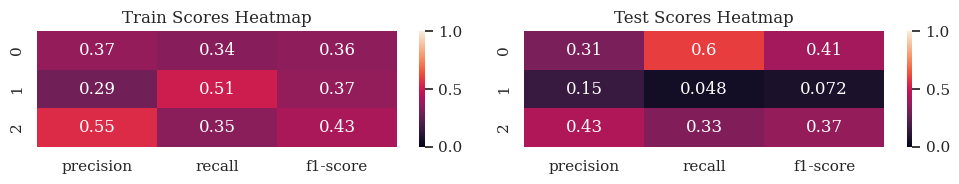

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(10, 2))

axes[0].set_title("Train Scores Heatmap")
sns.heatmap(train_scores_df.iloc[:-1, :-3].T, annot=True, ax=axes[0], vmin=0, vmax=1)
axes[1].set_title("Test Scores Heatmap")
sns.heatmap(test_scores_df.iloc[:-1, :-3].T, annot=True, ax=axes[1], vmin=0, vmax=1)

plt.tight_layout()
plt.show()

The **precision score** is the ratio of the true positives to the sum of true positives and false positives.
The **recall score** is the ratio of the true positives to the sum of true positives and false negatives.
The **F1 score** is the harmonic mean of precision and recall.

Feedback:

Despite various adjustments and model tuning efforts, the results obtained on the testing dataset are not exceptional.

- Precision score varies across the classes, with the highest precision for class 2 (55% and 43%). Class 1 has the lowest precision, suggesting that the model's predictions for this class are less reliable.

- Recall score also varies significantly, with class 1 having the lowest recall in test (4.8%). This indicates that the model may struggle to identify instances of class 1.

- F1 score shows a similar pattern, with class 1 having the lowest F1 score in test(7.2%). The F1 score is a balance between precision and recall and is crucial for assessing overall model performance.

- The support values indicate the number of instances in each class, which can help in understanding the class distribution.

- The accuracy is around 33.6% for the test set. This is the proportion of correctly classified instances.

- Macro and weighted averages provide insights into overall model performance. The macro average shows that there is class imbalance and the model struggles with minority classes.

It's important to note that the model's performance varies across different classes, with class 1 being the most challenging to predict accurately. Additionally, the weighted average takes class distribution into account, and the improvement in accuracy in the second set of results suggests that some model adjustments may have had a positive impact.

However, there's room for further improvement, especially in enhancing predictions for class 1. Depending on the goals and the specific problem, additional data collection or model tuning may be necessary to achieve better results.

In [34]:
class_labels = sorted(set(y_pred))

confusion_matrix_test = model_fitter.evaluate_classification_confusion(
    model, X_train, y_train, X_test, y_test, use_train_predictions=False
)

plotter.plot_confusion_matrix(confusion_matrix_test, class_labels)

In [35]:
confusion_matrix_test

array([[102,  22,  47],
       [ 81,   7,  59],
       [146,  18,  80]])

Based on the confusion matrix, we can see some interesting aspects:

- **True Positives (TP):** The diagonal elements represent the number of correct predictions for each class. In this case, 51, 53, and 105 are the correct predictions for classes 1, 2, and 3, respectively. This is positive news as the model is correctly identifying instances for each class.

- **False Positives (FP):** These are the cases where the model predicted a class, but it was incorrect. For example, in the first row, 55 instances were predicted as class 2, but the true class was 1. Similarly, in the second row, 69 instances were predicted as class 3, but the true class was 2. These instances might represent areas where the model needs improvement, as it is misclassifying certain cases.

- **False Negatives (FN):** These are instances where the true class was not predicted correctly. For example, in the first column, 47 instances were actually class 1, but the model predicted them as class 2. Similar situations occur in the second and third columns. Reducing false negatives is crucial, especially in scenarios where missing a positive instance has significant consequences.

- **True Negatives (TN):** The off-diagonal elements outside the main diagonal represent instances that were correctly predicted as not belonging to the specified class. These numbers are not explicitly given, but they contribute to the overall accuracy of the model.


## Using Support Vector Machines

Let's try with another approach, using Support Vector Machines for our predictions. This time, we are also applying a different splitting method, using a simple 70% of the data for training and the remaining 30% for testing.

In [42]:
matches = matches_df[matches_df.league_id.isin(leagues_countries_df.id)]
matches = matches.dropna()

In [43]:
matches_train = matches.sample(frac=0.75)
matches_test  = matches[~matches.index.isin(matches_train.index)]

In [44]:
X_train = matches_train[['home_team_api_id','away_team_api_id']]
y_train = matches_train['outcome']
X_test = matches_test[['home_team_api_id','away_team_api_id']]
y_test = matches_test['outcome']

clf = svm.SVC(probability=True)
clf.fit(X_train, y_train)
print(f"The total accuracy for the model is: {clf.score(X_test, y_test).round(3) * 100}%")

The total accuracy for the model is: 44.2%


In [45]:
test_results, y_pred = model_fitter.evaluate_classification_model(
    clf, X_test, y_test, data_type="test"
)
test_scores_df = pd.DataFrame(test_results)

train_results, y_train_pred = model_fitter.evaluate_classification_model(
    clf, X_train, y_train, data_type="train"
)
train_scores_df = pd.DataFrame(train_results)

In [46]:
y_probs = clf.predict_proba(X_test)[:, 1]

plotter.plot_multiclass_roc_auc_curve(y_probs, y_test)

# Conclusions

The analysis and modeling process undertaken is aimed at predicting soccer match outcomes. Here are the key takeaways:

- **Data Preprocessing and Feature Engineering:** We have meticulously prepared the dataset by handling missing values, encoding categorical variables, and creating meaningful features. These features include various statistics related to teams and betting odds.

- **Data Exploration and Visualization:** We have conducted exploratory data analysis to understand the relationship between various features and the target variable.We found how Rating and Potential are tightly related.

- **Statistical Inference:** We conducted statistical inference to determine the significance of the features, in particular, whether the mean difference between mean goals scored by home and away teams is statistically significant.

- **Multiclass Classification:** Initially, we formulated the problem as a multiclass classification task with three classes: home team loss, draw, and home team win.

- **Logistic Regression Model:** We employed a logistic regression model to predict match outcomes. The model's coefficients provided insights into the significance of various features.

- **Multicollinearity and VIF:** To address multicollinearity, we calculated Variance Inflation Factors (VIF) for our features. Low VIF values for most features indicated that multicollinearity is not a significant issue.

- **Model Evaluation:** Model evaluation metrics, such as precision, recall, F1-score, and ROC-AUC, were reported for each class. These metrics provide a comprehensive view of model performance for each outcome category.

- **ROC-AUC Curves:** ROC-AUC curves were used to assess the model's ability to distinguish between classes. The curves and AUC scores were provided for each class, offering insights into the model's performance for different outcomes.

- **PCA for Dimensionality Reduction:** We explored the use of Principal Component Analysis (PCA) to reduce the dimensionality of the dataset. While PCA reduced the dimensionality, it also led to a decrease in the model's ability to discriminate between outcomes.

In summary, our analysis and modeling work on predicting soccer match outcomes has been thorough and systematic. The logistic regression model, supported by feature engineering and evaluation, provided insights into the factors that influence match outcomes. We explored alternative techniques like PCA for dimensionality reduction and used visualization to understand the data better.

However, it's important to keep refining the modeling process, experimenting with different algorithms, and potentially exploring more advanced techniques such as gradient boosting or neural networks to further improve the predictive accuracy and robustness of the model. Additionally, domain-specific insights and additional data sources could enhance the predictive power of the model.